### I am trying to explore and recreate the function "get_slides" from sampling.py in sliderunner/SlideRunner/doc
#### This function is used at the beginning of the training notebook to create the images (smaller size)

#### Main challenge is to get the ground truth labels, bounding box for mitotic and mitotic look alike cells

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sqlite3
import numpy as np
from SlideRunner.dataAccess.database import Database
from SlideRunner.dataAccess.annotations import *
from tqdm import tqdm
from pathlib import Path
import os
from collections import defaultdict

import openslide

import matplotlib.pyplot as plt

size=512
path = Path('./')

#database = Database()
#database.open(str(path/'./databases/MITOS_WSI_CMC_CODAEL_TR.sqlite'))

#database.open('/databases/MITOS_WSI_CMC_CODAEL_TR.sqlite')



In [2]:
root_dir = os.getcwd()
database_dir = os.path.join(root_dir, 'databases')

#Specify the database SQL file
db_file = 'MITOS_WSI_CMC_COADEL_TR.sqlite'
db_path = os.path.join(database_dir, db_file)

#Specify directory of whole slide images
slide_dir = os.path.join(root_dir, 'WSI')


In [3]:
#Specify a slide number
slide_num = 1 # must be in this list [1,2, ..., 21]
filename = os.listdir(slide_dir)[slide_num]

#Get all the details about a paricular slide
slide_path = os.path.join(slide_dir, filename)  #basepath + os.sep + filename
slide = openslide.open_slide(str(slide_path))

dir(slide)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_filename',
 '_osr',
 'associated_images',
 'close',
 'detect_format',
 'dimensions',
 'get_best_level_for_downsample',
 'get_thumbnail',
 'level_count',
 'level_dimensions',
 'level_downsamples',
 'properties',
 'read_region']

In [4]:
img = slide.associated_images['macro']
type(img)

PIL.Image.Image

In [5]:
print(f" Associated Images of the slide : {slide.associated_images}")

print(f" format vendor of the specified slide : {slide.detect_format}")
print(f" dimension of the slide : {slide.dimensions}")

print(f" get_best_level_for_downsample of the slide : {slide.get_best_level_for_downsample(5)}")

print(f"\n Levels of the slide : {slide.level_count}")
print(f" level_downsamples (mag levels, 1 means highest mag) of the slide : {slide.level_downsamples}")
print(f" Level dimension (size for each magnification) of the slide : {slide.level_dimensions}")


print(f"\n Meta data associated with the slide : \n")

for k in slide.properties.keys():
    print(k, " *** ", slide.properties[k])


 Associated Images of the slide : <_AssociatedImageMap {'macro': <PIL.Image.Image image mode=RGBA size=1600x657 at 0x7F0001D3A040>, 'thumbnail': <PIL.Image.Image image mode=RGBA size=996x768 at 0x7F0001D3A2E0>}>
 format vendor of the specified slide : <bound method OpenSlide.detect_format of <class 'openslide.OpenSlide'>>
 dimension of the slide : (109799, 84591)
 get_best_level_for_downsample of the slide : 1

 Levels of the slide : 4
 level_downsamples (mag levels, 1 means highest mag) of the slide : (1.0, 4.000125578846618, 16.001928897602184, 32.00385779520437)
 Level dimension (size for each magnification) of the slide : ((109799, 84591), (27449, 21147), (6862, 5286), (3431, 2643))

 Meta data associated with the slide : 

aperio.AppMag  ***  40
aperio.DSR ID  ***  130.133.91.37
aperio.Date  ***  10/18/18
aperio.DisplayColor  ***  0
aperio.Exposure Scale  ***  0.000001
aperio.Exposure Time  ***  109
aperio.Filename  ***  022857018aa597374b6c
aperio.Focus Offset  ***  0.000000
aper

#slide_dir = os.path.join(root_dir, 'WSI')

### Disable this as markup to reduce the file size
for filename in os.listdir(slide_dir):
    slide_path = os.path.join(slide_dir, filename)  #basepath + os.sep + filename
    slide = openslide.open_slide(str(slide_path))
    img = slide.associated_images['macro']
    display(img)

size of slide: (109799, 84591)


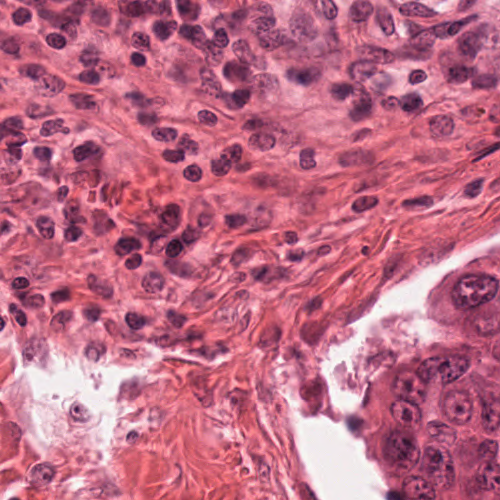

In [38]:
#Plot a sample region at full mag and the entire slide at the lowest mag

slide_num = 1 # must be in this list [1,2, ..., 21]
filename = os.listdir(slide_dir)[slide_num]

slide_path = os.path.join(slide_dir, filename)  #basepath + os.sep + filename
slide = openslide.open_slide(str(slide_path))
print(f"size of slide: {slide.dimensions}")
disp_size=(500,500)
img = slide.read_region((50000,50000), level=0, size=disp_size)
display(img)

img = slide.read_region((0,0), level=3, size=(3431, 2643))
#display(img)

In [39]:
# Calculate the number of patches for each WSI at level = 0, highest mag
# patch size = d = 256
for filename in os.listdir(slide_dir):
    slide_path = os.path.join(slide_dir, filename)  #basepath + os.sep + filename
    slide = openslide.open_slide(str(slide_path))
    
    (x,y) = slide.dimensions
    d = 256
    print(f"num in X :{int(x/d):.1f} num in Y: {int(y/d)}, total = {(int(x/d)*int(y/d))}")

num in X :492.0 num in Y: 340, total = 167280
num in X :428.0 num in Y: 330, total = 141240
num in X :492.0 num in Y: 327, total = 160884
num in X :464.0 num in Y: 329, total = 152656
num in X :435.0 num in Y: 346, total = 150510
num in X :386.0 num in Y: 322, total = 124292
num in X :239.0 num in Y: 320, total = 76480
num in X :274.0 num in Y: 255, total = 69870
num in X :485.0 num in Y: 330, total = 160050
num in X :513.0 num in Y: 327, total = 167751
num in X :372.0 num in Y: 329, total = 122388
num in X :534.0 num in Y: 249, total = 132966
num in X :428.0 num in Y: 340, total = 145520
num in X :478.0 num in Y: 301, total = 143878
num in X :457.0 num in Y: 332, total = 151724
num in X :407.0 num in Y: 298, total = 121286
num in X :239.0 num in Y: 224, total = 53536
num in X :478.0 num in Y: 307, total = 146746
num in X :421.0 num in Y: 318, total = 133878
num in X :175.0 num in Y: 186, total = 32550
num in X :379.0 num in Y: 351, total = 133029


### Now let's look at the annotation related information stored in SQL databases

In [40]:
#database.open(os.path.join(database_dir, database))
database = Database()
DB = database.open(db_path)

getslides = """SELECT uid, filename FROM Slides"""
DB.execute(getslides).fetchall()

[(1, 'a8773be388e12df89edd.svs'),
 (2, '460906c0b1fe17ea5354.svs'),
 (3, '2d56d1902ca533a5b509.svs'),
 (5, 'd0423ef9a648bb66a763.svs'),
 (6, '50cf88e9a33df0c0c8f9.svs'),
 (7, 'da18e7b9846e9d38034c.svs'),
 (8, 'd7a8af121d7d4f3fbf01.svs'),
 (9, '2191a7aa287ce1d5dbc0.svs'),
 (10, '69a02453620ade0edefd.svs'),
 (11, 'c4b95da36e32993289cb.svs'),
 (12, 'fa4959e484beec77543b.svs'),
 (13, '72c93e042d0171a61012.svs'),
 (14, '4eee7b944ad5e46c60ce.svs'),
 (15, 'b1bdee8e5e3372174619.svs'),
 (16, '3d3d04eca056556b0b26.svs'),
 (17, '084383c18b9060880e82.svs'),
 (18, 'e09512d530d933e436d5.svs'),
 (19, 'd37ab62158945f22deed.svs'),
 (20, 'deb768e5efb9d1dcbc13.svs'),
 (21, '022857018aa597374b6c.svs'),
 (22, '13528f1921d4f1f15511.svs')]

In [41]:
#get the name of the database
database.getDBname()

'MITOS_WSI_CMC_COADEL_TR.sqlite'

In [42]:
#list all the slides in the database
database.listOfSlides()

[(1, 'a8773be388e12df89edd.svs'),
 (2, '460906c0b1fe17ea5354.svs'),
 (3, '2d56d1902ca533a5b509.svs'),
 (5, 'd0423ef9a648bb66a763.svs'),
 (6, '50cf88e9a33df0c0c8f9.svs'),
 (7, 'da18e7b9846e9d38034c.svs'),
 (8, 'd7a8af121d7d4f3fbf01.svs'),
 (9, '2191a7aa287ce1d5dbc0.svs'),
 (10, '69a02453620ade0edefd.svs'),
 (11, 'c4b95da36e32993289cb.svs'),
 (12, 'fa4959e484beec77543b.svs'),
 (13, '72c93e042d0171a61012.svs'),
 (14, '4eee7b944ad5e46c60ce.svs'),
 (15, 'b1bdee8e5e3372174619.svs'),
 (16, '3d3d04eca056556b0b26.svs'),
 (17, '084383c18b9060880e82.svs'),
 (18, 'e09512d530d933e436d5.svs'),
 (19, 'd37ab62158945f22deed.svs'),
 (20, 'deb768e5efb9d1dcbc13.svs'),
 (21, '022857018aa597374b6c.svs'),
 (22, '13528f1921d4f1f15511.svs')]

In [43]:
# get a particular slide
slide_num = 11
currslide, filename = DB.execute(getslides).fetchall()[slide_num]

#load the WSI into memory
database.loadIntoMemory(currslide)

In [44]:
# Get all the keys for the annotation
# The keys will depend on what slide has been loaded into memory
database.annotations.keys()

dict_keys([17891, 17892, 17893, 17894, 17895, 17896, 17897, 17898, 17899, 17900, 17901, 17902, 17903, 17904, 17905, 17906, 17907, 17908, 17909, 17910, 17911, 17912, 17913, 17914, 17915, 17916, 17917, 17918, 17919, 17920, 17921, 17922, 17923, 17924, 17925, 17926, 17927, 17928, 17929, 17930, 17931, 17932, 17933, 17934, 17935, 17936, 17937, 17938, 17939, 17940, 17941, 17942, 17943, 17944, 17945, 17946, 17947, 17948, 17949, 17950, 17951, 17952, 17953, 17954, 17955, 17956, 17957, 17958, 17959, 17960, 17961, 17962, 17963, 17964, 17965, 17966, 17967, 17968, 17969, 17970, 17971, 17972, 17973, 17975, 17976, 17977, 17978, 17979, 17980, 17981, 17982, 17983, 17984, 17985, 17986, 17987, 17988, 17989, 17990, 17991, 17992, 17993, 17994, 17995, 17996, 17997, 18001, 18002, 18003, 18004, 18005, 18006, 18007, 18008, 18009, 18010, 18011, 18012, 18013, 18014, 18015, 18016, 18018, 18019, 18020, 18021, 18022, 18023, 18024, 18025, 18026, 18027, 18028, 18029, 18030, 18031, 18032, 18033, 18034, 18035, 18036, 18

In [45]:
# Print the label for each annotation
for k in database.annotations.keys():
    print(k, database.annotations[k].agreedLabel())

17891 1
17892 1
17893 1
17894 1
17895 1
17896 1
17897 1
17898 2
17899 1
17900 1
17901 1
17902 1
17903 1
17904 1
17905 1
17906 1
17907 1
17908 1
17909 1
17910 1
17911 1
17912 1
17913 2
17914 1
17915 2
17916 1
17917 1
17918 2
17919 1
17920 1
17921 2
17922 1
17923 1
17924 1
17925 1
17926 1
17927 1
17928 1
17929 1
17930 1
17931 1
17932 1
17933 1
17934 1
17935 1
17936 1
17937 1
17938 1
17939 1
17940 1
17941 1
17942 2
17943 1
17944 1
17945 1
17946 2
17947 1
17948 1
17949 1
17950 1
17951 1
17952 1
17953 1
17954 2
17955 1
17956 1
17957 1
17958 1
17959 1
17960 2
17961 1
17962 1
17963 1
17964 1
17965 1
17966 1
17967 2
17968 1
17969 1
17970 1
17971 2
17972 1
17973 1
17975 1
17976 1
17977 1
17978 1
17979 1
17980 1
17981 1
17982 1
17983 2
17984 1
17985 1
17986 2
17987 1
17988 1
17989 1
17990 1
17991 1
17992 1
17993 1
17994 1
17995 1
17996 1
17997 1
18001 2
18002 1
18003 1
18004 1
18005 2
18006 1
18007 1
18008 1
18009 1
18010 1
18011 1
18012 1
18013 2
18014 1
18015 1
18016 1
18018 1
18019 1
18020 1


In [47]:
#print all the details about a annoutation uid
ann_uid = np.random.choice(list(database.annotations.keys()))
print(f"annotation UID : {ann_uid}")
annot_details = vars(database.annotations[ann_uid])
for k in annot_details.items():
    print(k)

annotation UID : 376708
('annotationType', 1)
('labels', [<SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7f000003a4c0>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7efffbda14c0>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7efffbda1520>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7efffbda1580>])
('uid', 376708)
('text', '')
('agreedClass', 1)
('clickable', 1)
('guid', 'c7c2f49d-74b7-4675-a505-82e48e77f707')
('deleted', 0)
('lastModified', 1582189570.0521548)
('minimumAnnotationLabelZoom', 1)
('pluginAnnotationLabel', None)
('x1', 86095)
('y1', 8015)
('r', 25)
('zLevel', 0)


In [48]:
# Get all the details when the annotation is labeled as mistotic look alike
for anno_id in database.annotations.keys():
    anno_class = database.annotations[anno_id].agreedClass
    if anno_class ==1:
        print(vars(database.annotations[anno_id]))
        print(database.annotations[anno_id].labels.count(anno_id))
        print(f"agreed label: {database.annotations[anno_id].agreedLabel()}")
        break

{'annotationType': 1, 'labels': [<SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7efffbfde220>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7f00000057c0>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7f0000005820>], 'uid': 17891, 'text': '', 'agreedClass': 1, 'clickable': 1, 'guid': 'a0a43748-34a2-4bef-a51e-2ae7efc62d41', 'deleted': 0, 'lastModified': 1582189570.0521548, 'minimumAnnotationLabelZoom': 1, 'pluginAnnotationLabel': None, 'x1': 89684, 'y1': 5951, 'r': 25, 'zLevel': 0}
0
agreed label: 1


In [49]:
# Get all the details when the annotation is labeled as mistosis
for anno_id in database.annotations.keys():
    anno_class = database.annotations[anno_id].agreedClass
    if anno_class ==2:
        print(vars(database.annotations[anno_id]))
        print(database.annotations[anno_id].labels.count(anno_id))
        print(f"agreed label: {database.annotations[anno_id].agreedLabel()}")
        break
        

{'annotationType': 1, 'labels': [<SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7efffbfde4c0>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7f00000794c0>, <SlideRunner.dataAccess.annotations.AnnotationLabel object at 0x7f0000079520>], 'uid': 17898, 'text': '', 'agreedClass': 2, 'clickable': 1, 'guid': '537ba7fb-9bd3-46e7-8cb0-49a4a2b13b71', 'deleted': 0, 'lastModified': 1582189570.0521548, 'minimumAnnotationLabelZoom': 1, 'pluginAnnotationLabel': None, 'x1': 91128, 'y1': 6755, 'r': 25, 'zLevel': 0}
0
agreed label: 2


In [50]:
database.getGUID(23) #not sure what GUID means

#not sure what the max and min coordinates mean
database.maxCoords.shape, database.minCoords.shape

((838, 3), (838, 3))

In [51]:
#find attributes of the database

for attr in list(dir(database)):
    #print(f"\n***")
    #print(attr)
    #print(database.attr())
    continue
    
attributes = [attr for attr in dir(database) 
    if not attr.startswith('__')]

print(f"Printing all attributes of the database:\n\n")
for k in attributes:
    print(k)
params = ['agreedClass', 'agreedLabel', 'annotationType']
#for y in params:
#print(database.annotations.keys())
#break

Printing all attributes of the database:


VA
_allclasses
addAnnotationLabel
addAnnotationToDatabase
addTriggers
annotateImage
annotations
annotationsSlide
appendToMinMaxCoordsList
changeAllAnnotationLabelsOfType
changeAnnotationID
checkCommonAnnotation
checkIfAnnotatorLabeled
checkTableStructure
classPosition
commit
countEntries
countEntryPerClass
create
databaseStructure
db
dbOpened
dbcur
dbfilename
dbname
deleteClass
deleteTriggers
doCommit
exactUser
exchangePolygonCoordinates
execute
fetchAreaAnnotation
fetchSpotAnnotation
fetchall
fetchone
findAllAnnotationLabels
findAllAnnotations
findClassidOfClass
findClickAnnotation
findIntersectingAnnotation
findSlideForAnnotation
findSlideWithFilename
generateMinMaxCoordsList
getAllClasses
getAllPersons
getAnnotationZLevels
getAnnotatorByID
getClassByID
getDBname
getExactIDforSlide
getExactPerson
getGUID
getUnknownInCurrentScreen
getVisibleAnnotations
guids
insertAnnotator
insertClass
insertCoordinates
insertNewAreaAnnotation
insertNewImageA

In [52]:
# print all the attributes of the database
temp = vars(database)
for item in temp:
    print(item)
    if item in ['annotations', 'guids']:
        continue # do not print these two attribute values as they are big
    print(temp[item])
    print("***")

dbOpened
True
***
VA
{}
***
databaseStructure
{'Log': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f000033c850>, 'Slides': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f000033c910>, 'Annotations': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f005856ccd0>, 'Annotations_coordinates': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f005856c070>, 'Persons': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f005856c160>, 'Classes': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f00003e1af0>, 'Annotations_label': <SlideRunner.dataAccess.database.DatabaseTable object at 0x7f00003e1910>}
***
transformer
None
***
annotations
doCommit
True
***
annotationsSlide
13
***
exactUser
0
***
db
***
dbcur
***
dbfilename
/media/bony/Ganga_HDD_3TB/Ganges_Backup/Courses/FourthBrain_Cohort_8_June22_2022/capstone/MITOS_WSI_CMC/databases/MITOS_WSI_CMC_COADEL_TR.sqlite
***
dbname
MITOS_WSI_CMC_COADEL_TR.sqlite
***
_allclasses
[('Mito

In [53]:
# number of classes in the database
database.getAllClasses()

[('Mitotic cell look-alike', 1, '#0130d2'),
 ('Mitotic figure', 2, '#22ff0d'),
 ('Tumor region', 4, '#ff0000'),
 ('Exclude from tumor region', 5, '#7fc4ae')]

In [54]:
database.zLevel
print(f"total entry count : {database.countEntries()}")
# Count of entries per class, includes all 21 WSIs
print(f"\nCount of entries per class :\n")
for k in database.countEntryPerClass().items():
    print(k)

total entry count : 50322

Count of entries per class :

('unknown', {'uid': 0, 'count_total': 0, 'count_slide': 0})
('Mitotic cell look-alike', {'uid': 1, 'count_total': 36129, 'count_slide': 0})
('Mitotic figure', {'uid': 2, 'count_total': 14154, 'count_slide': 0})
('Tumor region', {'uid': 4, 'count_total': 37, 'count_slide': 0})
('Exclude from tumor region', {'uid': 5, 'count_total': 2, 'count_slide': 0})


In [55]:
# Create list of annotation UID by agreed class
# we will use this list later to plot some annotation regions randomly

annotation_list_by_type = defaultdict(list)

for k in database.annotations.keys():
    annot_class = database.annotations[k].agreedClass
    annotation_list_by_type[annot_class].append(k)
    
len(annotation_list_by_type[1]), len(annotation_list_by_type[2])

(678, 153)

In [56]:
# find all annotations, not sure what the output means
# probably returns the location for an annotation id
anno_id = np.random.choice(annotation_list_by_type[1]) #get a random annotation UID from class 1
print(f"Annotation UID: {anno_id}, all annotations: {database.findAllAnnotations(anno_id)}")

anno_id = np.random.choice(annotation_list_by_type[2]) #get a random annotation UID from class 2
print(f"Annotation UID: {anno_id}, all annotations: {database.findAllAnnotations(anno_id)}")


Annotation UID: 18119, all annotations: [(77809, 37448)]
Annotation UID: 31133, all annotations: [(65990, 32665)]


In [57]:
#details of each annotation, arugment is the annotation ID
anno_id = np.random.choice(annotation_list_by_type[1]) #get a random annotation UID from class 1
print(database.fetchAreaAnnotation(anno_id))
print(database.findAllAnnotations(anno_id))

anno_id = np.random.choice(annotation_list_by_type[2]) #get a random annotation UID from class 2
print(database.fetchAreaAnnotation(anno_id))
print(database.findAllAnnotations(anno_id))


((75776, 47527), None, [('Mitotic figure',), ('Mitotic cell look-alike',), ('Mitotic cell look-alike',), ('Mitotic cell look-alike',)], [('RetinaNet',), ('Christof',), ('Robert',), ('Christof and Robert',)])
[(75776, 47527)]
((94356, 32114), None, [('Mitotic figure',), ('Mitotic figure',), ('Mitotic figure',)], [('Christof',), ('Robert',), ('Christof and Robert',)])
[(94356, 32114)]


In [58]:
database.findAllAnnotationLabels(anno_id)

[(1, 2, 31100), (2, 2, 65004), (3, 2, 65005)]

In [59]:
#find the WSI that is associated with this annotation UID
database.findSlideForAnnotation(anno_id)

[('72c93e042d0171a61012.svs',)]

In [60]:
# Get the z levels for each WSI file annotation
# note that there are 21, one for each file, #4 is missing
# 0 means highest zoom level
for x in range(1,23):
    print(x, database.getAnnotationZLevels(x))

1 [0]
2 [0]
3 [0]
4 []
5 [0]
6 [0]
7 [0]
8 [0]
9 [0]
10 [0]
11 [0]
12 [0]
13 [0]
14 [0]
15 [0]
16 [0]
17 [0]
18 [0]
19 [0]
20 [0]
21 [0]
22 [0]


In [61]:
# get the description of each class
for k in range(1, 6):
    print(k, "  ***  ", database.getClassByID(k))

1   ***   Mitotic cell look-alike
2   ***   Mitotic figure
3   ***   -unknown-3-
4   ***   Tumor region
5   ***   Exclude from tumor region


### Print a few annotaion attributes and values and count the number of annotations

In [62]:

anno_count = 0
for id, annotation in database.annotations.items():
    anno_count += 1
    if anno_count ==1:
        print(f"Annotation attributes :\n{dir(annotation)}")
        print("*")
        
        print(f"\nAnnotation attribute values for the first annotation :\n{vars(annotation)}")
        print(f"\n Description: {annotation.getDescription(DB)}, \n annotationType: {annotation.annotationType}")
        print(f"\n Bounding box: {annotation.getBoundingBox()}, \n center: {annotation.getCenter()}, \n x1: {annotation.x1}, y1 = {annotation.y1}, text: {annotation.text}")
        print(f"\n Agreed Label: {annotation.agreedLabel()}, agreedClass: {annotation.agreedClass}")
        
print(f"\nTotal annotation count :{anno_count}")

Annotation attributes :
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_create_annohandle', 'addLabel', 'agreedClass', 'agreedLabel', 'annotationType', 'changeLabel', 'clickable', 'convertToPath', 'coordinates', 'deleted', 'draw', 'getAnnotationsDescription', 'getBoundingBox', 'getCenter', 'getColor', 'getDescription', 'getDimensions', 'guid', 'intersectingWithAnnotation', 'labelBy', 'labels', 'lastModified', 'majorityLabel', 'maxCoordinates', 'maxLabelClass', 'minCoordinates', 'minimumAnnotationLabelZoom', 'pluginAnnotationLabel', 'positionInAnnotation', 'positionInAnnotationHandle', 'r', 'removeLabel', 'setAgreedClass', 'text', 'uid', 'x1', 'y1', 'zLevel']
*

Annotation attribute values for

In [63]:
positive_class:int=2
down_factor = 1 #slide.level_downsamples[level]
classes = {positive_class: 1} # Map non-mitosis to background

labels, bboxes = [], []
annotations = dict()
        
for id, annotation in database.annotations.items():
    if annotation.deleted or annotation.annotationType != AnnotationType.SPOT:
        continue
    annotation.r = 25
    d = 2 * annotation.r / down_factor
    x_min = (annotation.x1 - annotation.r) / down_factor
    y_min = (annotation.y1 - annotation.r) / down_factor
    x_max = x_min + d
    y_max = y_min + d
    if annotation.agreedClass not in annotations:
        annotations[annotation.agreedClass] = dict()
        annotations[annotation.agreedClass]['bboxes'] = list()
        annotations[annotation.agreedClass]['label'] = list()
        
    annotations[annotation.agreedClass]['bboxes'].append([int(x_min), int(y_min), int(x_max), int(y_max)])
    annotations[annotation.agreedClass]['label'].append(annotation.agreedClass)

    if annotation.agreedClass in classes:
        label = classes[annotation.agreedClass]

        bboxes.append([int(x_min), int(y_min), int(x_max), int(y_max)])
        labels.append(label)

In [64]:
slide.associated_images['macro']
slide.properties

<_PropertyMap {'aperio.AppMag': '40', 'aperio.DSR ID': '130.133.91.37', 'aperio.Date': '10/18/18', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '69a02453620ade0edefd', 'aperio.Focus Offset': '0.000000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '50191', 'aperio.Left': '28.864033', 'aperio.LineAreaXOffset': '0.003040', 'aperio.LineAreaYOffset': '-0.011652', 'aperio.LineCameraSkew': '-0.000450', 'aperio.MPP': '0.2533', 'aperio.OriginalHeight': '90176', 'aperio.OriginalWidth': '99360', 'aperio.ScanScope ID': 'VETWE12MIC', 'aperio.SessonMode': 'NR', 'aperio.StripeWidth': '1840', 'aperio.Time': '17:09:45', 'aperio.Time Zone': 'GMT+02:00', 'aperio.Title': '69a02453620ade0edefd', 'aperio.Top': '23.042255', 'aperio.User': '00000000-0000-0000-0000-000000000000', 'openslide.comment': 'Aperio Image Library v12.0.15 ..99360x90176 [0,100 97199x90076] (240x240) J2K/KDU Q=70|AppMag = 40|StripeWidth = 1840|ScanScope ID

In [65]:
# Dimensions of the slide at different mag levels
slide.level_dimensions

((97199, 90076), (24299, 22519), (6074, 5629), (3037, 2814))

In [66]:
def calculate_bbox(x, y, r=25, m=1):
    """
    Calculates bounding box of an annotation
    Inputs:
    x: annotation center X coordinate
    y: annotation center Y coordinate
    r: Radius around the annotation center
    m: Microscope mag
    
    Output:
    a list of 4 numbers that defines the bounding box
    """
    d = 2 * r / m
    
    x_min = (x - r) / m
    y_min = (y - r) / m
    
    x_max = x_min + d
    y_max = y_min + d
    
    bbox = [int(x_min), int(y_min), int(x_max), int(y_max)]
    
    return bbox

### Plot a few zoomed in region with a blue circle around the mitosis cells

In [67]:
database.listOfSlides()

[(1, 'a8773be388e12df89edd.svs'),
 (2, '460906c0b1fe17ea5354.svs'),
 (3, '2d56d1902ca533a5b509.svs'),
 (5, 'd0423ef9a648bb66a763.svs'),
 (6, '50cf88e9a33df0c0c8f9.svs'),
 (7, 'da18e7b9846e9d38034c.svs'),
 (8, 'd7a8af121d7d4f3fbf01.svs'),
 (9, '2191a7aa287ce1d5dbc0.svs'),
 (10, '69a02453620ade0edefd.svs'),
 (11, 'c4b95da36e32993289cb.svs'),
 (12, 'fa4959e484beec77543b.svs'),
 (13, '72c93e042d0171a61012.svs'),
 (14, '4eee7b944ad5e46c60ce.svs'),
 (15, 'b1bdee8e5e3372174619.svs'),
 (16, '3d3d04eca056556b0b26.svs'),
 (17, '084383c18b9060880e82.svs'),
 (18, 'e09512d530d933e436d5.svs'),
 (19, 'd37ab62158945f22deed.svs'),
 (20, 'deb768e5efb9d1dcbc13.svs'),
 (21, '022857018aa597374b6c.svs'),
 (22, '13528f1921d4f1f15511.svs')]

### Read in a new slide and load the file into memory

In [68]:
# get a particular slide
slide_num = 1 # must be in this list [1,2, ..., 21]
currslide, filename = DB.execute(getslides).fetchall()[slide_num]
print(currslide, filename)

#filename = os.listdir(slide_dir)[slide_num]
print(filename)

slide_path = os.path.join(slide_dir, filename)  #basepath + os.sep + filename
slide = openslide.open_slide(str(slide_path))

#load the WSI into memory
database.loadIntoMemory(currslide)

slide.associated_images['macro'], slide.properties
for k in slide.properties.items():
    print(k)


2 460906c0b1fe17ea5354.svs
460906c0b1fe17ea5354.svs
('aperio.AppMag', '40')
('aperio.DSR ID', '130.133.91.37')
('aperio.Date', '08/10/18')
('aperio.DisplayColor', '0')
('aperio.Exposure Scale', '0.000001')
('aperio.Exposure Time', '109')
('aperio.Filename', '460906c0b1fe17ea5354')
('aperio.Focus Offset', '0.000000')
('aperio.ICC Profile', 'ScanScope v1')
('aperio.ImageID', '48747')
('aperio.Left', '17.783236')
('aperio.LineAreaXOffset', '0.003040')
('aperio.LineAreaYOffset', '-0.011652')
('aperio.LineCameraSkew', '-0.000450')
('aperio.MPP', '0.2533')
('aperio.OriginalHeight', '63931')
('aperio.OriginalWidth', '139840')
('aperio.ScanScope ID', 'VETWE12MIC')
('aperio.SessonMode', 'NR')
('aperio.StripeWidth', '1840')
('aperio.Time', '16:25:59')
('aperio.Time Zone', 'GMT+02:00')
('aperio.Title', '460906c0b1fe17ea5354')
('aperio.Top', '18.463364')
('aperio.User', '00000000-0000-0000-0000-000000000000')
('openslide.comment', 'Aperio Image Library v12.0.15 ..139840x63931 [0,100 136800x63831] 

In [69]:
# Create list of annotation UID by agreed class
# we will use this list later to plot some annotation regions randomly

annotation_list_by_type = defaultdict(list)

for k in database.annotations.keys():
    annot_class = database.annotations[k].agreedClass
    annotation_list_by_type[annot_class].append(k)
    
len(annotation_list_by_type[1]), len(annotation_list_by_type[2])

(2474, 748)

### Plot some random sample of mitotic regions

[29545 30058   332]


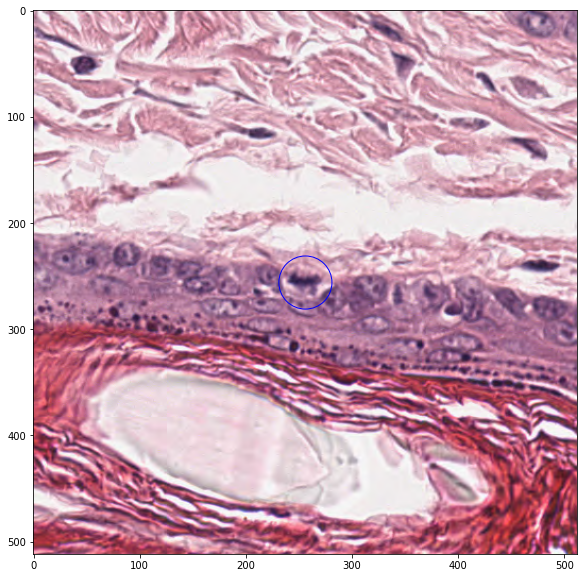

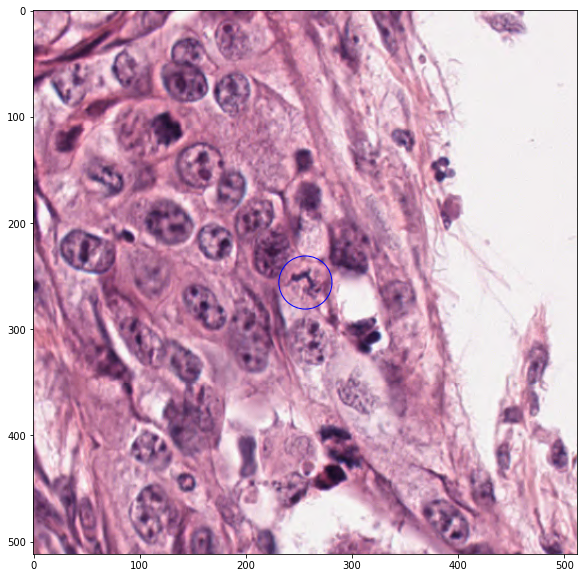

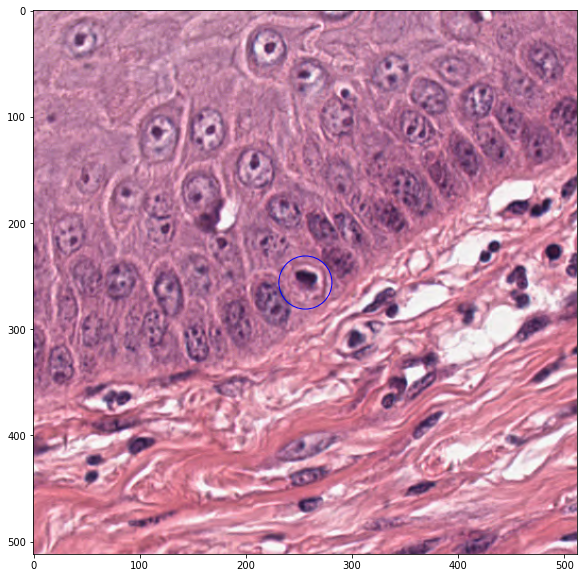

In [70]:
cls_2_count = 0

# Sample 20 random mitotic cell regions
sample_of_mitotic_cells = np.random.choice(annotation_list_by_type[2], 3)
print(sample_of_mitotic_cells)


#for id, annotation in database.annotations.items():
for annot_uid in sample_of_mitotic_cells: #database.annotations.items():
  
    annotation = database.annotations[annot_uid]
    if annotation.deleted or annotation.annotationType != AnnotationType.SPOT:
        continue
    else:
        
        x = annotation.x1
        y = annotation.y1
        cls = annotation.agreedClass
        #print(annotation.annotationType, annotation.agreedClass, x, y)
        bbox = calculate_bbox(x,y)
        #print(bbox)
        
        if cls == 2:
            #print(f"Annotation UID: {annot_uid}")
            fig, ax = plt.subplots(figsize=(10,10)) # note we must use plt.subplots, not plt.subplot
            cls_2_count += 1
            disp_size=(512,512)
            img = slide.read_region((x-256,y-256), level=0, size=disp_size)
            #display(img)
            #plt.imshow(img)
            ax.imshow(img)
            
            circle2 = plt.Circle((256, 256), 25, color='blue', fill=False)
            ax.add_patch(circle2)
            #ax.add_title(f"Annotation UID: {annot_uid}")
            #ax.title()
        #if cls_2_count == 10:
        #    break

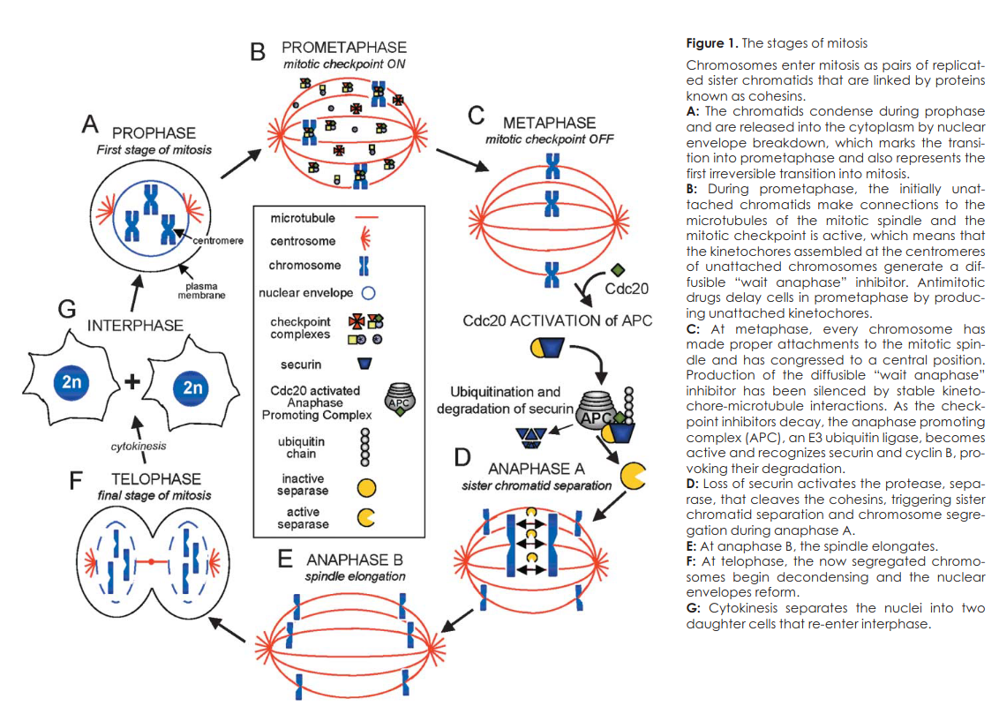

In [71]:
from IPython import display
display.Image("mitosis_stages.png")

### Plot a few zoomed in region with a blue circle around the mitotic cell look alike

1 1 100954 4107
1 1 95398 4827
1 1 99359 4991
1 1 99528 5069
1 1 98473 5998
1 1 101907 5682
1 1 94582 6348
1 1 101449 6373
1 1 103447 6949
1 1 103528 6443
1 1 97663 7399
1 1 97373 7117
1 1 98356 7178
1 1 99276 7092
1 1 99682 7043
1 1 100146 7635
1 1 100053 7636
1 1 99688 6912
1 1 103217 7071
1 1 103769 7318


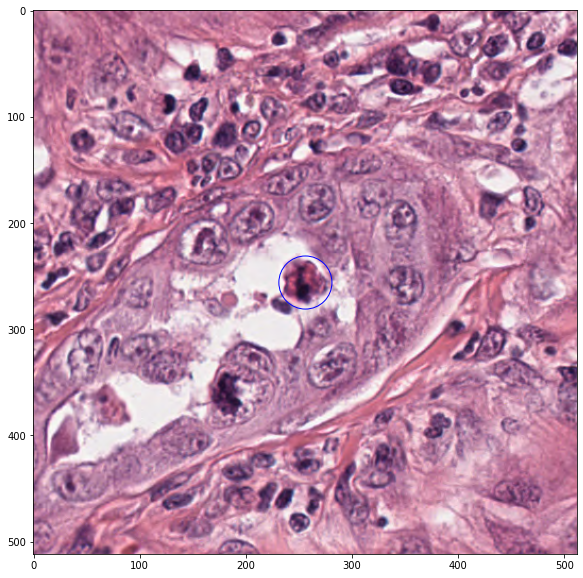

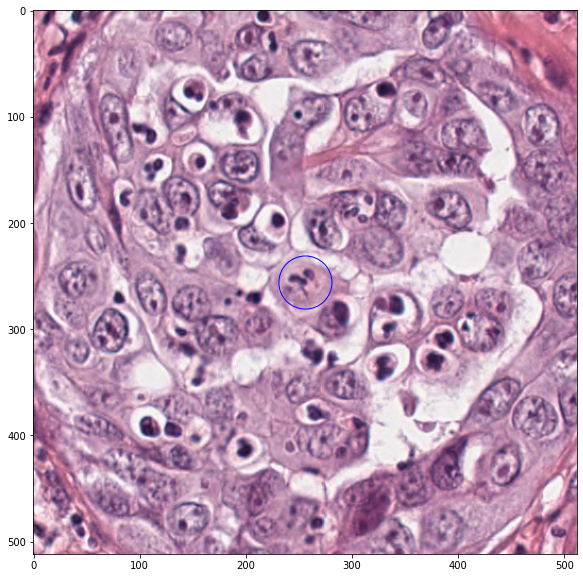

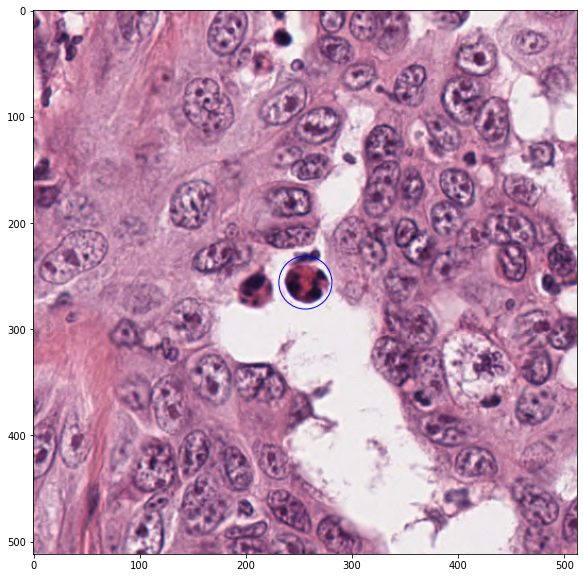

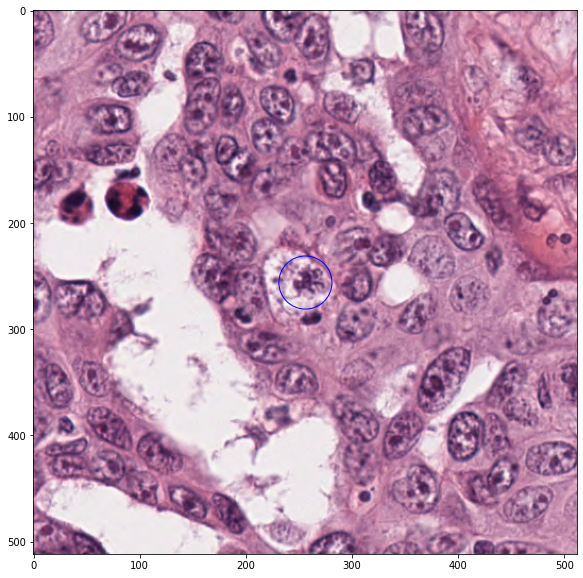

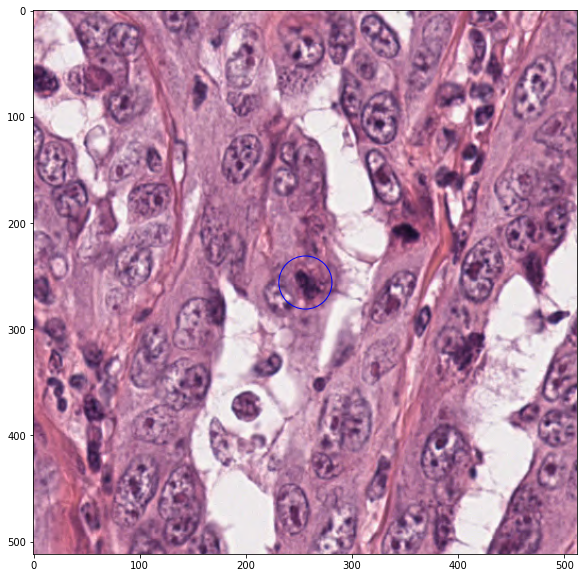

...

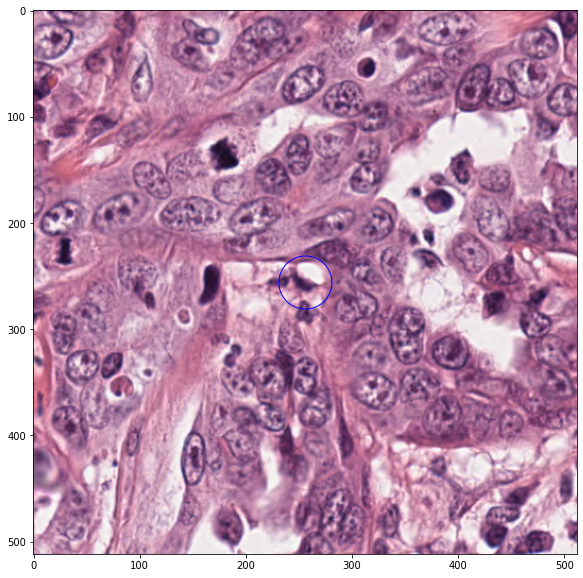

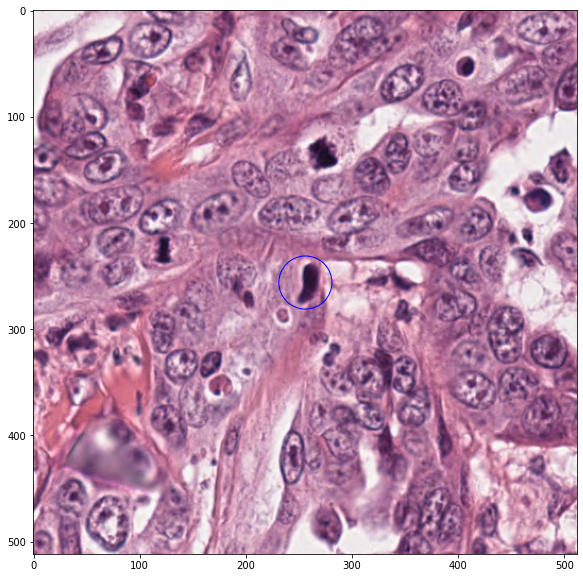

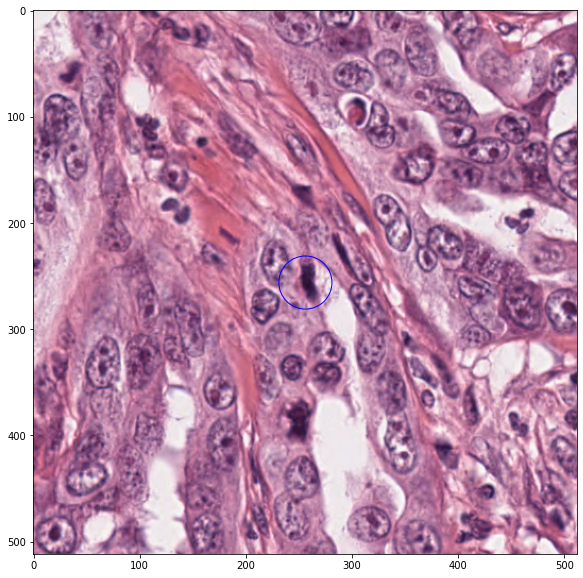

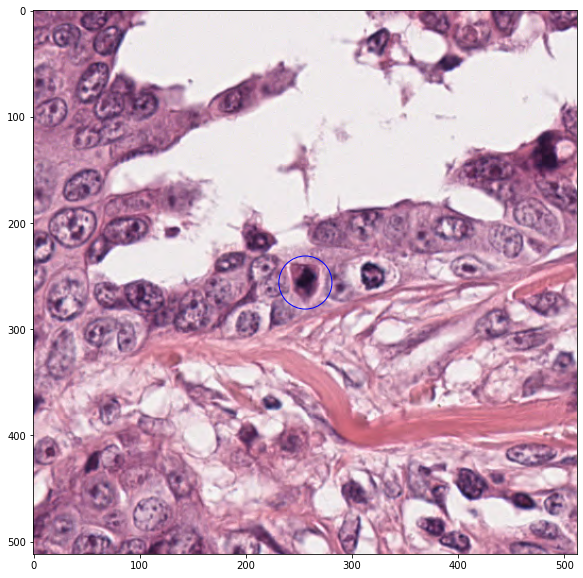

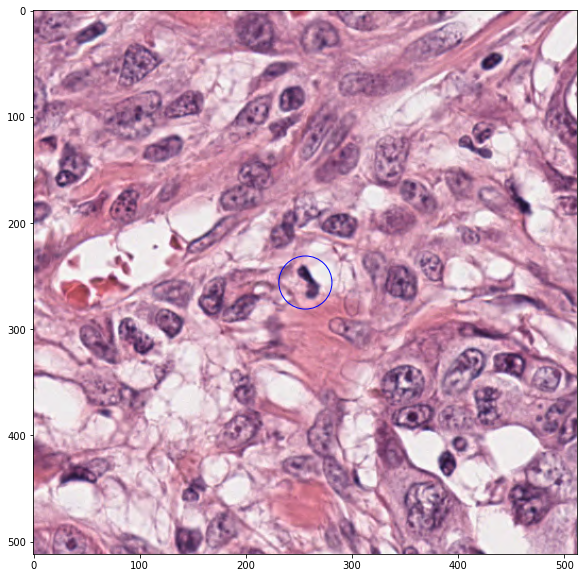

In [72]:
cls_1_count = 0

for id, annotation in database.annotations.items():
    #print(annotation.annotationType)
    
    
    if annotation.deleted or annotation.annotationType != AnnotationType.SPOT:
        continue
    else:
        
        x = annotation.x1
        y = annotation.y1
        cls = annotation.agreedClass
        
        bbox = calculate_bbox(x,y)
        #print(bbox)
        
        if cls == 1:
            print(annotation.annotationType, annotation.agreedClass, x, y)
            fig, ax = plt.subplots(figsize=(10,10)) # note we must use plt.subplots, not plt.subplot
            cls_1_count += 1
            disp_size=(512,512)
            img = slide.read_region((x-256,y-256), level=0, size=disp_size)
            #display(img)
            #plt.imshow(img)
            ax.imshow(img)
            
            circle2 = plt.Circle((256, 256), 25, color='blue', fill=False)
            ax.add_patch(circle2)
        if cls_1_count == 20:
            break



### Find all the mitotic cells in a 512 X 512 region

In [73]:
def checkInside_box(image_top_left_xy, image_size, annot_xy):
    img_x = image_top_left_xy[0]
    img_y = image_top_left_xy[1]
    
    x1 = annot_xy[0]
    y1 = annot_xy[1]
    
    if (x1 <= img_x) or (x1 >= img_x + image_size) or (y1 <= img_y) or (y1 >= img_y+image_size):
        return False
    
    else:
        return True
    

In [74]:
image_top_left_xy = [97780, 3900]
mit_cell_list = []
for annot in annotation_list_by_type[2]:
    annotation = database.annotations[annot]
    
    [x1,y1] = [annotation.x1, annotation.y1]
    #print([x1,y1])
    
    if checkInside_box(image_top_left_xy, 512, [x1,y1]):
        mit_cell_list.append([x1,y1])

print(len(mit_cell_list))
    

1


In [75]:
(x,y) = slide.dimensions
d = 512
zone_with_nonzero_count = 0

for n1 in range(int(x/d)):
    for n2 in range(int(y/d)):
        image_top_left_xy = [n1*d, n2*d]
        
        mit_cell_list = []
        for annot in annotation_list_by_type[2]:
            annotation = database.annotations[annot]

            [x1,y1] = [annotation.x1, annotation.y1]
            #print([x1,y1])

            if checkInside_box(image_top_left_xy, 512, [x1,y1]):
                mit_cell_list.append([x1,y1])

        if len(mit_cell_list) > 0:
            #print(image_top_left_xy, "  ***  ", len(mit_cell_list))
            zone_with_nonzero_count += 1

print(f" number of zones with non zero count : {zone_with_nonzero_count}")
    
        

 number of zones with non zero count : 657


In [76]:
n1*n2

32718

### Collect statistics pf patches to see if some of them can be ignored right away

In [77]:
(x,y) = slide.dimensions
disp_size = 512
half_size = int(disp_size/2)
zone_with_nonzero_count = 0
color_map = {} #save the mean value of pixel intensity per channel in this dict for each patch

for n1 in range(int(x/d)):
    for n2 in range(int(y/d)):
        (x,y) = (n1*d, n2*d)
        
        img = np.asarray(slide.read_region((x-256, y-256), level=0, size=(disp_size, disp_size)))
        mean = np.mean(img, axis=(0,1))
        color_map[(x,y)] = mean

In [78]:
#most of the white regions seem to have mean around at least 235 
if np.min(color_map[(5120, 4608)][:3]) > 242:
    print("44")

44


In [142]:
x,y = slide.dimensions
int(x/disp_size)*int(y/disp_size)

33108

In [79]:
#slide.associated_images['macro']

In [80]:
#count how many patches for this WSI has not-white regions, threshold = 235
count = 0
for k, item in color_map.items():
    if np.max(item[:3]) < 235:
        #print(k, item[:3])
        count += 1
print(count)

2631


(512, 512, 4)
[226.13738632 214.14323044 221.98667145 255.        ]


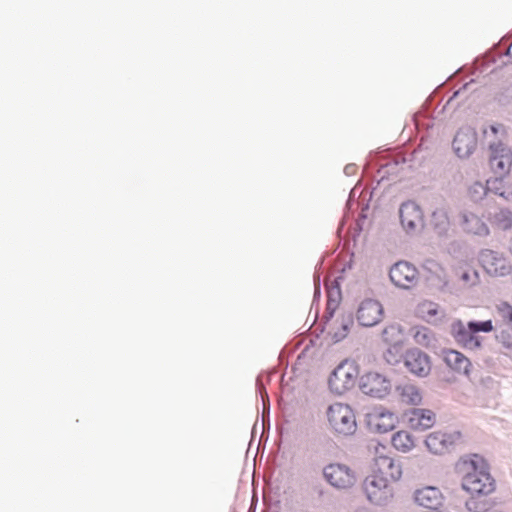

In [81]:
image_top_left_xy = [2560, 10752]
img = slide.read_region((image_top_left_xy[0]-256, image_top_left_xy[1]-256), level=0, size=(disp_size, disp_size))

img1 = np.asarray(img)
print(img1.shape)
print(np.mean(img1, axis=(0,1)))
img

In [82]:
slide.dimensions

(136800, 63831)

In [83]:
img
img1 = np.asarray(img)
img1.shape
np.mean(img1, axis=(0,1))

array([226.13738632, 214.14323044, 221.98667145, 255.        ])

In [84]:
# the last channel, #4 is always 255
img1[:10, :10, 3]

array([[255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255]], dtype=uint8)